## Transfer Learning Officical Practical Commencement by `Mr. Harshit Dawar`!

### Downloading the food dataset (coloured one)!

In [1]:
# Downloading the dataset
!wget "https://onedrive.live.com/download?cid=86213B68AE250972&resid=86213B68AE250972%2129101&authkey=ANqUGrvowv3Jt7M" -O food_data.zip

--2021-08-01 08:18:59--  https://onedrive.live.com/download?cid=86213B68AE250972&resid=86213B68AE250972%2129101&authkey=ANqUGrvowv3Jt7M
Resolving onedrive.live.com (onedrive.live.com)... 13.107.42.13
Connecting to onedrive.live.com (onedrive.live.com)|13.107.42.13|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ohlmhg.sn.files.1drv.com/y4m_mN4M7uguBDhoVdEF3OQf8zL1Js9dwES4S5OgGXk4SeRmM1ntJ2iHQpqH8A6Jnuvxz_EVhCMN748QtaUKtOhuNOtZ7KJo33RvWRfkugAEO8u_o3RMYq5fS981qwdWljcQcI8lPXX9kUbGMK1v3zX5y8CASH3xrWV-I8lgKwho35cXL2M1rG8GFfdhnDQVjUCNeCwAuN_ihtWfb8zrdzKWA/10_food_classes_10_percent.zip?download&psid=1 [following]
--2021-08-01 08:18:59--  https://ohlmhg.sn.files.1drv.com/y4m_mN4M7uguBDhoVdEF3OQf8zL1Js9dwES4S5OgGXk4SeRmM1ntJ2iHQpqH8A6Jnuvxz_EVhCMN748QtaUKtOhuNOtZ7KJo33RvWRfkugAEO8u_o3RMYq5fS981qwdWljcQcI8lPXX9kUbGMK1v3zX5y8CASH3xrWV-I8lgKwho35cXL2M1rG8GFfdhnDQVjUCNeCwAuN_ihtWfb8zrdzKWA/10_food_classes_10_percent.zip?download&psid=1
Resolving ohlmhg.sn.fil

In [ ]:
# Extracting the Dataset
!unzip food_data.zip

## Starting the Project

In [3]:
# Importing the required Libraries
import os
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as tf_hub

In [ ]:
# Checking the no. of Images of each category
for directory_path, directory_name, filenames in os.walk("10_food_classes_10_percent"):
  print("There are {} no. of Images and {} no. of Directories in {}".format(len(filenames), len(directory_name), directory_path))

In [4]:
# Creating a Reference to Training & Testing Data!

training_data_path = "10_food_classes_10_percent/train"
testing_data_path = "10_food_classes_10_percent/test"

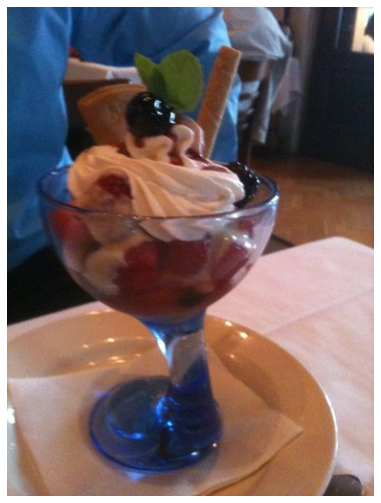

In [ ]:
image = tf.keras.preprocessing.image.load_img("10_food_classes_10_percent/train/ice_cream/104465.jpg")
# print(image.shape)
plt.figure(figsize = (15, 9))
plt.imshow(image)
plt.axis(False)
plt.show()

(512, 384, 3)


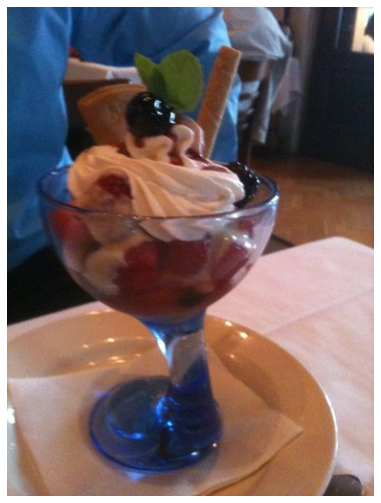

In [ ]:
image = plt.imread("10_food_classes_10_percent/train/ice_cream/104465.jpg")
print(image.shape)
plt.figure(figsize = (15, 9))
plt.imshow(image)
plt.axis(False)
plt.show()

In [5]:
# Creating a funciton to print a random image & its shape!
import random

def show_image():
  random_class = random.choice(os.listdir(testing_data_path))
  random_image_path = testing_data_path + "/" + random_class
  random_image = random.choice(os.listdir(random_image_path))
  
  random_image = plt.imread(random_image_path + "/" + random_image)
  print("Image Shape: ", random_image.shape)
  plt.figure(figsize = (15, 9))
  plt.imshow(random_image)
  plt.title("Image Class = " + random_class)
  plt.axis(False)
  plt.show()


  normalized_random_image = random_image / 255.0
  print("Normalized Image Shape: ", normalized_random_image.shape)
  plt.figure(figsize = (15, 9))
  plt.imshow(normalized_random_image)
  plt.title("Normalized Image Class = " + random_class)
  plt.axis(False)
  plt.show()

Image Shape:  (512, 306, 3)


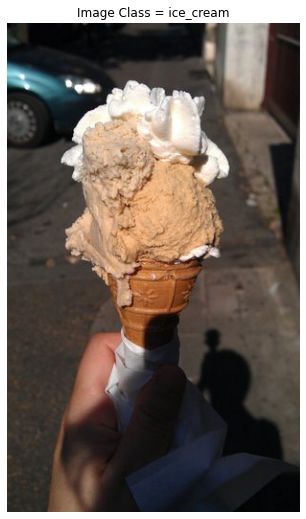

Normalized Image Shape:  (512, 306, 3)


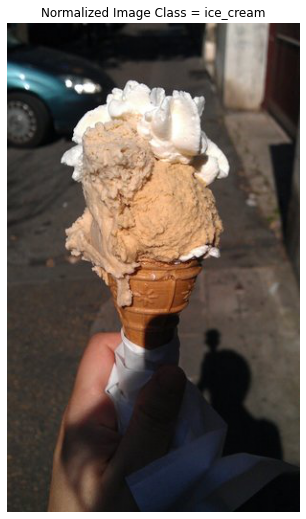

In [ ]:
 # Testing our random Image function
 show_image()

In [6]:
# Normalizing the Dataset & Creating Training & Testing Data Generator!
from tensorflow.keras.preprocessing.image import ImageDataGenerator

training_data_gen = ImageDataGenerator(rescale = 1/255.0)
testing_data_gen = ImageDataGenerator(rescale = 1/255.0)

image_size = (224, 224)     # Number of channels is not required here too mention
batch_size = 35

training_data = training_data_gen.flow_from_directory(
                                                      training_data_path,
                                                      class_mode = "categorical",
                                                      target_size = image_size,
                                                      batch_size = batch_size
                                                      )

testing_data = testing_data_gen.flow_from_directory(
                                                      testing_data_path,
                                                      class_mode = "categorical",
                                                      target_size = image_size,
                                                      batch_size = batch_size
                                                      )

Found 750 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


## Generating A Transfer Learning Model (MobileNet V3) [Feature Extraction Transfer Learning]

In [11]:
# Creating a Transfer Learning Model Layer
MobileNet_V3_Layer = tf_hub.KerasLayer(
                                      "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/feature_vector/5",
                                       trainable = False,      # I am asking to do not train the hidden layers, freezing them
                                       input_shape = (224, 224, 3)
                                       )


In [ ]:
# Generating the Model
TF_Model_MobileNet_V3 = tf.keras.models.Sequential([
                                                   MobileNet_V3_Layer,
                                                   tf.keras.layers.Dense(units = 10, activation = "softmax")
])

In [ ]:
TF_Model_MobileNet_V3.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1024)              1529968   
_________________________________________________________________
dense_1 (Dense)              (None, 10)                10250     
Total params: 1,540,218
Trainable params: 10,250
Non-trainable params: 1,529,968
_________________________________________________________________


In [ ]:
# Compiling & Training the Model
TF_Model_MobileNet_V3.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = ["accuracy"])

MV3_history = TF_Model_MobileNet_V3.fit(training_data, epochs = 10, validation_data = testing_data)

Epoch 1/10
22/22 [==============================] - 16s 700ms/step - loss: 1.9982 - accuracy: 0.3320 - val_loss: 1.5369 - val_accuracy: 0.5536
Epoch 2/10
22/22 [==============================] - 14s 669ms/step - loss: 1.2570 - accuracy: 0.6667 - val_loss: 1.0984 - val_accuracy: 0.7144
Epoch 3/10
22/22 [==============================] - 14s 637ms/step - loss: 0.9184 - accuracy: 0.7773 - val_loss: 0.8994 - val_accuracy: 0.7656
Epoch 4/10
22/22 [==============================] - 13s 633ms/step - loss: 0.7380 - accuracy: 0.8267 - val_loss: 0.7965 - val_accuracy: 0.7880
Epoch 5/10
22/22 [==============================] - 14s 641ms/step - loss: 0.6230 - accuracy: 0.8613 - val_loss: 0.7355 - val_accuracy: 0.7972
Epoch 6/10
22/22 [==============================] - 14s 681ms/step - loss: 0.5416 - accuracy: 0.8787 - val_loss: 0.6923 - val_accuracy: 0.8056
Epoch 7/10
22/22 [==============================] - 14s 668ms/step - loss: 0.4769 - accuracy: 0.8947 - val_loss: 0.6654 - val_accuracy: 0.8096

In [ ]:
TF_Model_MobileNet_V3.evaluate(testing_data)

72/72 [==============================] - 11s 158ms/step - loss: 0.6125 - accuracy: 0.8220


[0.6125295758247375, 0.8220000267028809]

In [7]:
def plot_graphs(model_history, model_name, epoch_count = 10):
  plt.figure(figsize = (15, 7))
  plt.plot(model_history.history["loss"], label = "Loss")
  plt.plot(model_history.history["val_loss"], label = "Val_Loss")
  plt.legend()
  plt.grid()
  plt.xlabel("Epochs")
  plt.ylabel("Loss Quantity")
  plt.xlim(-1, epoch_count)
  plt.title(model_name + " Loss Graph")
  plt.show()


  plt.figure(figsize = (15, 7))
  plt.plot(model_history.history["accuracy"], label = "Accuracy")
  plt.plot(model_history.history["val_accuracy"], label = "Val_Accuracy")
  plt.legend()
  plt.grid()
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.xlim(-1, epoch_count)
  plt.title(model_name + " Accuracy Graph")
  plt.show()

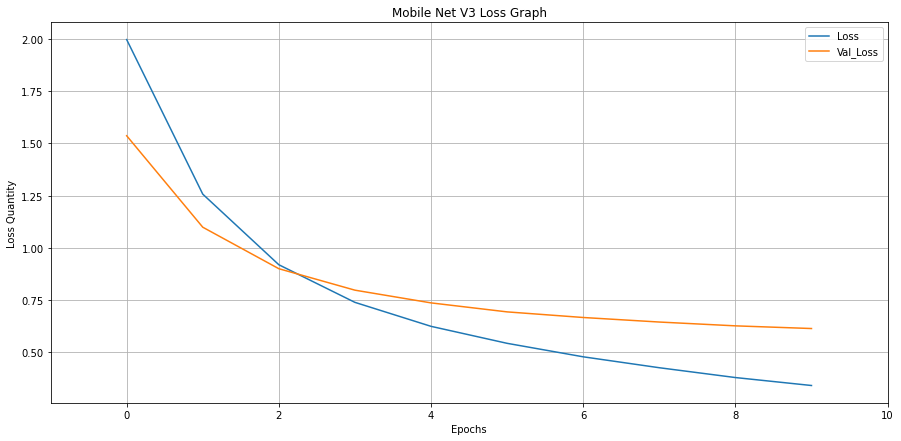

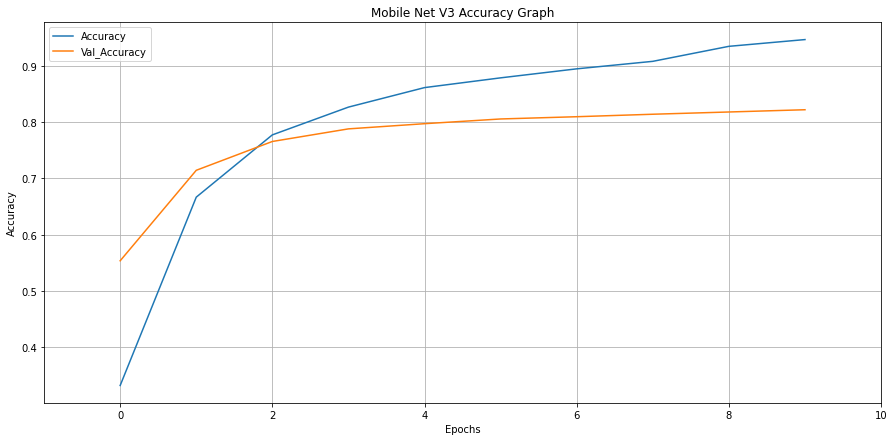

In [ ]:
plot_graphs(MV3_history, "Mobile Net V3")

## Defining Callbacks

In [8]:
def tensorboard_callback(directory_name, model_name):
  return tf.keras.callbacks.TensorBoard(log_dir = directory_name + "/" + model_name)

In [12]:
# Generating the Model
TF_Model_MobileNet_V3_with_Callbacks = tf.keras.models.Sequential([
                                                   MobileNet_V3_Layer,
                                                   tf.keras.layers.Dense(units = 10, activation = "softmax")
])

In [13]:
# Compiling & Training the Model
TF_Model_MobileNet_V3_with_Callbacks.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = ["accuracy"])

MV3_history = TF_Model_MobileNet_V3_with_Callbacks.fit(training_data, epochs = 10, validation_data = testing_data, callbacks = [tensorboard_callback("Logs", "MV3")])

Epoch 1/10
22/22 [==============================] - 46s 2s/step - loss: 1.9312 - accuracy: 0.3440 - val_loss: 1.4916 - val_accuracy: 0.5896
Epoch 2/10
22/22 [==============================] - 41s 2s/step - loss: 1.2185 - accuracy: 0.7000 - val_loss: 1.0735 - val_accuracy: 0.7256
Epoch 3/10
22/22 [==============================] - 51s 2s/step - loss: 0.8881 - accuracy: 0.7960 - val_loss: 0.8882 - val_accuracy: 0.7688
Epoch 4/10
22/22 [==============================] - 41s 2s/step - loss: 0.7180 - accuracy: 0.8293 - val_loss: 0.7899 - val_accuracy: 0.7908
Epoch 5/10
22/22 [==============================] - 41s 2s/step - loss: 0.6100 - accuracy: 0.8520 - val_loss: 0.7322 - val_accuracy: 0.7972
Epoch 6/10
22/22 [==============================] - 51s 2s/step - loss: 0.5275 - accuracy: 0.8693 - val_loss: 0.6917 - val_accuracy: 0.8048
Epoch 7/10
22/22 [==============================] - 51s 2s/step - loss: 0.4627 - accuracy: 0.8973 - val_loss: 0.6611 - val_accuracy: 0.8092
Epoch 8/10
22/22 [==

In [93]:
%reload_ext tensorboard
%tensorboard --logdir "Logs/"

<IPython.core.display.Javascript object>

## Model Training with Data Augmentation 

In [56]:
# Import Tensorflow Data Augmentation Layer
from tensorflow.keras.layers.experimental import preprocessing as p

# Create a layer with the Data Augmentation!
Data_Augmentation_Layer = tf.keras.Sequential([
                                               p.RandomWidth(0.4),
                                               p.RandomHeight(0.4),
                                               p.RandomFlip("horizontal"),
                                               p.RandomRotation(0.5),
                                               p.RandomContrast(0.2),
                                              #  p.RandomCrop(0.3, 0.3)
])


In [53]:
Data_Augmentation_Layer.layers

In [59]:
import numpy as np

def show_image_augmented():
  random_class = random.choice(os.listdir(testing_data_path))
  random_image_path = testing_data_path + "/" + random_class
  random_image = random.choice(os.listdir(random_image_path))
  
  random_image = plt.imread(random_image_path + "/" + random_image)
  plt.figure(figsize = (15, 5))
  plt.imshow(random_image)
  plt.title("Image Class = " + random_class)
  plt.axis(False)
  plt.show()


  plt.figure(figsize = (15, 5))
  plt.imshow(
      np.squeeze(
    Data_Augmentation_Layer(
        np.expand_dims(random_image, axis = 0) / 255.0
        ) 
      )
    )
  plt.title("Augmented Image" )
  plt.axis(False)
  plt.show()


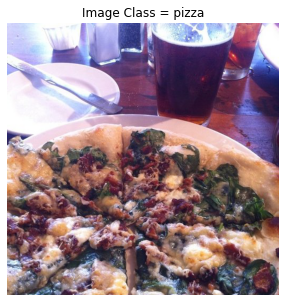

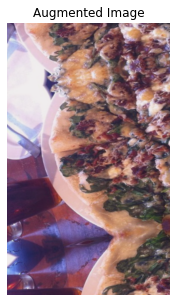

In [60]:
show_image_augmented()

In [85]:
# Importing Transfer Learning Model without using Tensorflow Hub
Starting_Model = tf.keras.applications.ResNet50V2(include_top = False)
Starting_Model.trainable = False

In [ ]:
for layer in Starting_Model.layers:
  print(layer.name, layer.trainable)

In [91]:
inputs_for_model = tf.keras.layers.Input(shape = (224, 224, 3))

'''
DA_TF_Model = tf.keras.Sequential([
                                   
                                   Data_Augmentation_Layer(inputs_for_model),
                                   Starting_Model,
                                   tf.keras.layers.GlobalAveragePooling2D(),
                                   tf.keras.layers.Dense(units = 10, activation = "softmax")
])
'''

# Funcitonal API Model Building
DA_TF_Model = Data_Augmentation_Layer(inputs_for_model)
DA_TF_Model = Starting_Model(DA_TF_Model)
DA_TF_Model = tf.keras.layers.GlobalAveragePooling2D()(DA_TF_Model)
# DA_TF_Model = tf.keras.layers.Flatten()(DA_TF_Model)          
               
""" Flatten will not Work, because Flatten cannot completely combine & flatten the neurons/parameters with
 "None" as this is the outout shape of Flatten. But, on the other hand, GlobalAverage Pooling2D only takes into
  account the heigth & width of the image, "None" is not present there."""

outputs = tf.keras.layers.Dense(units = 10, activation = "softmax")(DA_TF_Model)

Final_Model = tf.keras.Model(inputs_for_model, outputs)  # Model constructed


Final_Model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = ["accuracy"])




In [92]:
Final_Model.fit(training_data, epochs = 3, validation_data = testing_data, callbacks = [tensorboard_callback("Logs", "DA_TF")])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/3
22/22 [==============================] - 447s 21s/step - loss: 2.2204 - accuracy: 0.2560 - val_loss: 1.5845 - val_accuracy: 0.4416
Epoch 2/3
22/22 [==============================] - 438s 21s/step - loss: 1.5222 - accuracy: 0.5240 - val_loss: 1.1543 - val_accuracy: 0.6332
Epoch 3/3
22/22 [==============================] - 422s 20s/step - loss: 1.2880 - accuracy: 0.5693 - val_loss: 0.9763 - val_accuracy: 0.6828
